# Proyecto I+D para software de detección de tumores

Determinar en los diferentes condados de California la cantidad de operaciones de cáncer y sus principales hospitales entre los años 2013 y 2018. Para que de esta forma los hospitales puedan identificar donde se encuentran los mayores casos de operaciones por cáncer y de que tipo son cada operación para poder comercializar el producto XXXXXX.

## 0. Import libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import requests
from bs4 import BeautifulSoup

## 1. Data cleanning

In [2]:
cancer= pd.read_csv(r'cancer_surgeries.csv', encoding='latin')
cancer

,year,county,Hospital,OSHPDID,Surgery,# of Cases (ICD 9),# of Cases (ICD 10),LATITUDE,LONGITUDE
0,2013,NaN,Statewide,NaN,COLON,7128.0,NaN,NaN,NaN
1,2013,NaN,Statewide,NaN,BLADDER,892.0,NaN,NaN,NaN
2,2013,NaN,Statewide,NaN,RECTUM,2128.0,NaN,NaN,NaN
3,2013,NaN,Statewide,NaN,BREAST,25829.0,NaN,NaN,NaN
4,2013,NaN,Statewide,NaN,BRAIN,2719.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
11816,2018,Yuba,Rideout Memorial Hospital,106580996.0,Rectum,NaN,4.0,39.138805,-121.593602
11817,2018,Yuba,Rideout Memorial Hospital,106580996.0,Prostate,NaN,6.0,39.138805,-121.593602
11818,2018,Yuba,Rideout Memorial Hospital,106580996.0,Lung,NaN,16.0,39.138805,-121.593602
11819,2018,Yuba,Rideout Memorial Hospital,106580996.0,Colon,NaN,19.0,39.138805,-121.593602


In [3]:
cancer.county.value_counts()

Los Angeles        3287
Orange              878
San Diego           757
Riverside           609
San Bernardino      535
Alameda             507
Santa Clara         482
Sacramento          410
San Francisco       375
Contra Costa        296
San Mateo           278
Ventura             276
Kern                260
San Joaquin         253
Fresno              235
Stanislaus          171
Solano              157
Sonoma              154
San Luis Obispo     149
Placer              141
Monterey            136
Santa Barbara       135
Butte               120
Humboldt             99
Marin                96
Tulare               90
Napa                 86
Shasta               84
Santa Cruz           74
El Dorado            58
Imperial             54
Yolo                 52
Yuba                 49
Nevada               48
Mendocino            47
Kings                41
Merced               33
Siskiyou             31
Lake                 28
Tuolumne             23
Sutter               21
Madera          

## 1.1 Stats

In [4]:
cancer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11821 entries, 0 to 11820
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   year                 11821 non-null  int64  
 1   county               11755 non-null  object 
 2   Hospital             11821 non-null  object 
 3   OSHPDID              11755 non-null  float64
 4   Surgery              11821 non-null  object 
 5   # of Cases (ICD 9)   5729 non-null   float64
 6   # of Cases (ICD 10)  6092 non-null   float64
 7   LATITUDE             11748 non-null  float64
 8   LONGITUDE            11748 non-null  float64
dtypes: float64(5), int64(1), object(3)
memory usage: 831.3+ KB


In [5]:
cancer.describe()

,year,OSHPDID,# of Cases (ICD 9),# of Cases (ICD 10),LATITUDE,LONGITUDE
count,11821.000000,1.175500e+04,5729.000000,6092.000000,11748.000000,11748.000000
mean,2015.523983,1.062823e+08,49.448769,56.127708,35.630675,-119.552318
std,1.709742,1.347787e+05,590.833097,680.657920,2.135230,2.020634
min,2013.000000,1.060107e+08,1.000000,1.000000,32.619090,-124.195140
25%,2014.000000,1.061904e+08,2.000000,2.000000,33.949170,-121.776854
50%,2016.000000,1.063013e+08,8.000000,8.000000,34.274589,-118.486230
75%,2017.000000,1.063713e+08,24.000000,27.000000,37.747990,-117.955240
max,2018.000000,1.065810e+08,25829.000000,29349.000000,41.772780,-114.595600


In [6]:
#Nulls
cancer.isnull().sum()

year                      0
county                   66
Hospital                  0
OSHPDID                  66
Surgery                   0
# of Cases (ICD 9)     6092
# of Cases (ICD 10)    5729
LATITUDE                 73
LONGITUDE                73
dtype: int64

In [7]:
corr = cancer.corr()
print(corr)

                         year   OSHPDID  # of Cases (ICD 9)  \
year                 1.000000 -0.002088           -0.005879   
OSHPDID             -0.002088  1.000000            0.018509   
# of Cases (ICD 9)  -0.005879  0.018509            1.000000   
# of Cases (ICD 10)  0.002318  0.015259                 NaN   
LATITUDE            -0.011049  0.056437           -0.030995   
LONGITUDE            0.013064 -0.074503            0.014841   

                     # of Cases (ICD 10)  LATITUDE  LONGITUDE  
year                            0.002318 -0.011049   0.013064  
OSHPDID                         0.015259  0.056437  -0.074503  
# of Cases (ICD 9)                   NaN -0.030995   0.014841  
# of Cases (ICD 10)             1.000000 -0.032443   0.012921  
LATITUDE                       -0.032443  1.000000  -0.928717  
LONGITUDE                       0.012921 -0.928717   1.000000  


In [8]:
cancer

,year,county,Hospital,OSHPDID,Surgery,# of Cases (ICD 9),# of Cases (ICD 10),LATITUDE,LONGITUDE
0,2013,NaN,Statewide,NaN,COLON,7128.0,NaN,NaN,NaN
1,2013,NaN,Statewide,NaN,BLADDER,892.0,NaN,NaN,NaN
2,2013,NaN,Statewide,NaN,RECTUM,2128.0,NaN,NaN,NaN
3,2013,NaN,Statewide,NaN,BREAST,25829.0,NaN,NaN,NaN
4,2013,NaN,Statewide,NaN,BRAIN,2719.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
11816,2018,Yuba,Rideout Memorial Hospital,106580996.0,Rectum,NaN,4.0,39.138805,-121.593602
11817,2018,Yuba,Rideout Memorial Hospital,106580996.0,Prostate,NaN,6.0,39.138805,-121.593602
11818,2018,Yuba,Rideout Memorial Hospital,106580996.0,Lung,NaN,16.0,39.138805,-121.593602
11819,2018,Yuba,Rideout Memorial Hospital,106580996.0,Colon,NaN,19.0,39.138805,-121.593602


### 1.2 Cleanning

In [9]:

#SAcramento
cancer['LATITUDE']=cancer['LATITUDE'].fillna(34.037185)
cancer['LONGITUDE']=cancer['LONGITUDE'].fillna(-118.266206)

#Round years
cancer['year']=cancer['year'].round(0)

#Fill nulls with 0
cancer['# of Cases (ICD 9)']=cancer['# of Cases (ICD 9)'].fillna(0)
cancer['# of Cases (ICD 10)']=cancer['# of Cases (ICD 10)'].fillna(0)

#Join ICD 9 and ICD 10 in one column
cancer['Total Cases']=cancer['# of Cases (ICD 9)']+ cancer['# of Cases (ICD 10)']

#Remove ICD 9 and ICD 10 from df
cancer= cancer.drop(['# of Cases (ICD 9)','# of Cases (ICD 10)','OSHPDID' ], axis=1)


cancer.columns = cancer.columns.str.strip().str.capitalize().str.replace(' ', '_')

#Fill nulls with Sacramento, because statewide is in Sacramento county
cancer['County']=cancer['County'].fillna('Sacramento')

#Surgery column into lower
cancer['Surgery'] = cancer['Surgery'].str.lower().str.title()

#Round total cases
cancer['Total_cases']=cancer['Total_cases'].astype(int).round(0)



In [10]:
#Add cost column

costs = {'Colon':52, 'Breast':30, 'Stomach':72, 'Rectum':52, 'Prostate':153, 'Lung':56, 'Brain':100, 'Liver':100, 'Bladder':65, 'Pancreas':74, 'Esophagus':250}
cancer['Cost'] = cancer['Surgery'].map(costs)


In [11]:
#Pivot table total cases pero cancer in every hospital
cancer_surgery_sum = pd.pivot_table(data = cancer,
                             index = ['Hospital'],
                             columns=['Surgery'],
                             values = ['Total_cases'],aggfunc = 'sum')

cancer_surgery_sum

Total_cases                      \
Surgery                                  Bladder Brain Breast  Colon   
Hospital                                                               
234038                                       NaN   NaN    NaN    5.0   
384202                                       NaN   NaN    7.0    1.0   
AHMC Anaheim Regional Medical Center         6.0  11.0  619.0  164.0   
Adventist Health Howard Memorial             NaN   NaN    NaN    2.0   
Adventist Medical Center                     4.0   NaN  248.0  120.0   
...                                          ...   ...    ...    ...   
Western Medical Center Anaheim               NaN   NaN    8.0    7.0   
Western Medical Center  Santa Ana           NaN  15.0   47.0   17.0   
White Memorial Medical Center                3.0  66.0  517.0  132.0   
Whittier Hospital Medical Center             NaN   NaN  105.0   64.0   
Woodland Memorial Hospital                   NaN   NaN  324.0   56.0   

                                                                               \
Surgery                              Esophagus Liver   Lung Pancreas Prostate   
Hospital                                                                        
234038                                     NaN   1.0    NaN      NaN      NaN   
384202                                     NaN   NaN    NaN      NaN      NaN   
AHMC Anaheim Regional Medical Center       8.0   NaN  105.0      2.0     29.0   
Adventist Health Howard Memorial           NaN   NaN    NaN      NaN      NaN   
Adventist Medical Center                   5.0   3.0    9.0      1.0     27.0   
...                                        ...   ...    ...      ...      ...   
Western Medical Center Anaheim             NaN   NaN    1.0      NaN      NaN   
Western Medical Center  Santa Ana         NaN   1.0    3.0      NaN      1.0   
White Memorial Medical Center              4.0   3.0   20.0      4.0     12.0   
Whittier Hospital Medical Center           1.0   2.0    9.0      NaN      5.0   
Woodland Memorial Hospital                 NaN   NaN    6.0      1.0      5.0   

                                                     
Surgery                              Rectum Stomach  
Hospital                                             
234038                                  NaN     NaN  
384202                                  1.0     NaN  
AHMC Anaheim Regional Medical Center   22.0    20.0  
Adventist Health Howard Memorial        NaN     NaN  
Adventist Medical Center               46.0     6.0  
...                                     ...     ...  
Western Medical Center Anaheim          1.0     NaN  
Western Medical Center  Santa Ana      1.0     3.0  
White Memorial Medical Center          60.0    30.0  
Whittier Hospital Medical Center       33.0    15.0  
Woodland Memorial Hospital             33.0     4.0  

[343 rows x 11 columns]

## 2. Complementary data

### 2.1 Californa Per capita income

In [12]:

url = "https://es.wikipedia.org/wiki/Anexo:Localidades_de_California_por_renta_per_c%C3%A1pita"
page = requests.get(url)
soup = BeautifulSoup(page.content, "html.parser")

table = soup.find("table", {"class": "wikitable"})
rows = table.find_all("tr")[1:]

localidades = []
for row in rows:
    cols = row.find_all("td")
    localidad = cols[2].text
    renta = cols[3].text
    localidades.append({"localidad": localidad, "renta_per_capita": renta})

print(localidades)

df=pd.DataFrame(localidades)

[{'localidad': 'Condado de Marin', 'renta_per_capita': '$44,962'}, {'localidad': 'Condado de San Mateo', 'renta_per_capita': '$36,045'}, {'localidad': 'Condado de San Francisco', 'renta_per_capita': '$34,556'}, {'localidad': 'Condado de Santa Clara', 'renta_per_capita': '$32,795'}, {'localidad': 'Condado de Contra Costa', 'renta_per_capita': '$30,615'}, {'localidad': 'Condado de Ventura', 'renta_per_capita': '$29,634'}, {'localidad': 'Condado de Placer', 'renta_per_capita': '$27,963'}, {'localidad': 'Condado de Alameda', 'renta_per_capita': '$26,860'}, {'localidad': 'Condado de Santa Cruz', 'renta_per_capita': '$26,396'}, {'localidad': 'Condado de Napa', 'renta_per_capita': '$26,395'}, {'localidad': 'Condado de Orange', 'renta_per_capita': '$25,826'}, {'localidad': 'Condado de Sonoma', 'renta_per_capita': '$25,724'}, {'localidad': 'Condado de El Dorado', 'renta_per_capita': '$25,560'}, {'localidad': 'Condado de Alpine', 'renta_per_capita': '$24,431'}, {'localidad': 'Condado de Nevada',

In [13]:
#Remove str 'condado de' to merge renta_per_capita with cancer df
df['County']=df['localidad'].str.replace('Condado de ', '')
df['County'] = df.County.apply(lambda x: x.replace('Los Ángeles', "Los Angeles"))
df['County'] = df.County.apply(lambda x: x.replace('Santa Bárbara', "Santa Barbara"))
df['County'] = df.County.apply(lambda x: x.replace('San Joaquín', "San Joaquin"))
df['County'] = df.County.apply(lambda x: x.replace('Monterrey', "Monterey"))

In [14]:
#Merge renta_per_capita with the cancer df
#To know the renta_per_capita for each county
cancer = cancer.merge(df[['County', 'renta_per_capita']])

In [15]:
#Remove characters to transform into int
cancer['renta_per_capita'] = cancer.renta_per_capita.str.replace('$', '')
cancer['renta_per_capita'] = cancer.renta_per_capita.str.replace(',', '')

#Object to int
cancer['renta_per_capita'] = cancer.renta_per_capita.astype(int)

/var/folders/kv/d6xc1zws7w7403s69264637m0000gn/T/ipykernel_3731/2704801231.py:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  cancer['renta_per_capita'] = cancer.renta_per_capita.str.replace('$', '')


### 2.2 Population per county

In [16]:
url_pob = 'https://es.wikipedia.org/wiki/Anexo:Condados_de_California'

req_pob = requests.get(url_pob, 'html.parser')

soup_pob = BeautifulSoup(req_pob.content)

In [17]:
div = soup_pob.find('div', {"id":"mw-content-text"})
table = div.find(name='table', class_="wikitable sortable")
th = table.find_all('th')
td = table.find_all('td')

titles = []
for i in th:
    titles.append(i.text)
    
titles = titles[9:]


pob = []

for i in td:
    if len(i.find_all('span')) > 0:
        i = i.find_all('span')
        pob.append(i[0].text)

poblacion = []
for x in range(0, 118, 2):
    poblacion.append(pob[x])

poblacion.remove('[')

pob_df = pd.DataFrame(titles)
pob_df['poblacion'] = poblacion
pob_df.columns = [['County', 'Poblacion']]

In [18]:
#Remove \n from county and remove words Condado de
pob_df['County'] = pob_df.County.applymap(lambda x: x.replace('\n', ""))
pob_df['County'] = pob_df.County.applymap(lambda x: x.replace('Condado de ', ''))

#Remove special characters from names
pob_df['County'] = pob_df.County.applymap(lambda x: x.replace('Los Ángeles', "Los Angeles"))
pob_df['County'] = pob_df.County.applymap(lambda x: x.replace('Santa Bárbara', "Santa Barbara"))
pob_df['County'] = pob_df.County.applymap(lambda x: x.replace('San Joaquín', "San Joaquin"))
pob_df['County'] = pob_df.County.applymap(lambda x: x.replace('Monterrey', "Monterey"))


#Remove $ from pobalcion
pob_df['Poblacion'] = pob_df.Poblacion.applymap(lambda x: x.replace('&', ''))

#transform dtypes to str and float
pob_df.County = pob_df.County.astype(str)
pob_df.Poblacion = pob_df.Poblacion.astype(float)


In [19]:
#Flat index
pob_df.columns = pob_df.columns.to_flat_index()
pob_df.columns = ['County', 'Poblacion']

In [20]:
#Merge cancer df on County
cancer = cancer.merge(pob_df, on='County')

In [21]:
cancer.County.value_counts()

Los Angeles        3287
Orange              878
San Diego           757
Riverside           609
San Bernardino      535
Alameda             507
Santa Clara         482
Sacramento          476
San Francisco       375
Contra Costa        296
San Mateo           278
Ventura             276
Kern                260
San Joaquin         253
Fresno              235
Stanislaus          171
Solano              157
Sonoma              154
San Luis Obispo     149
Placer              141
Monterey            136
Santa Barbara       135
Butte               120
Humboldt             99
Marin                96
Tulare               90
Napa                 86
Shasta               84
Santa Cruz           74
El Dorado            58
Imperial             54
Yolo                 52
Yuba                 49
Nevada               48
Mendocino            47
Kings                41
Merced               33
Siskiyou             31
Lake                 28
Tuolumne             23
Sutter               21
Madera          

In [22]:
cancer

,Year,County,Hospital,Surgery,Latitude,Longitude,Total_cases,Cost,renta_per_capita,Poblacion
0,2013,Sacramento,Statewide,Colon,34.037185,-118.266206,7128,52,21142,1223499.0
1,2013,Sacramento,Statewide,Bladder,34.037185,-118.266206,892,65,21142,1223499.0
2,2013,Sacramento,Statewide,Rectum,34.037185,-118.266206,2128,52,21142,1223499.0
3,2013,Sacramento,Statewide,Breast,34.037185,-118.266206,25829,30,21142,1223499.0
4,2013,Sacramento,Statewide,Brain,34.037185,-118.266206,2719,100,21142,1223499.0
...,...,...,...,...,...,...,...,...,...,...
11816,2018,Yuba,Rideout Memorial Hospital,Colon,39.138805,-121.593602,19,52,14124,71938.0
11817,2018,Yuba,Rideout Memorial Hospital,Breast,39.138805,-121.593602,15,30,14124,71938.0
11818,2014,Lassen,Banner Lassen Medical Center,Rectum,40.423060,-120.646090,1,52,14749,11805.0
11819,2015,Lassen,Banner Lassen Medical Center,Breast,40.423060,-120.646090,1,30,14749,11805.0


In [23]:
cancer.to_csv('cancer_surgeries_final.csv')

## 3 Graphs

Text(0, 0.5, '#')

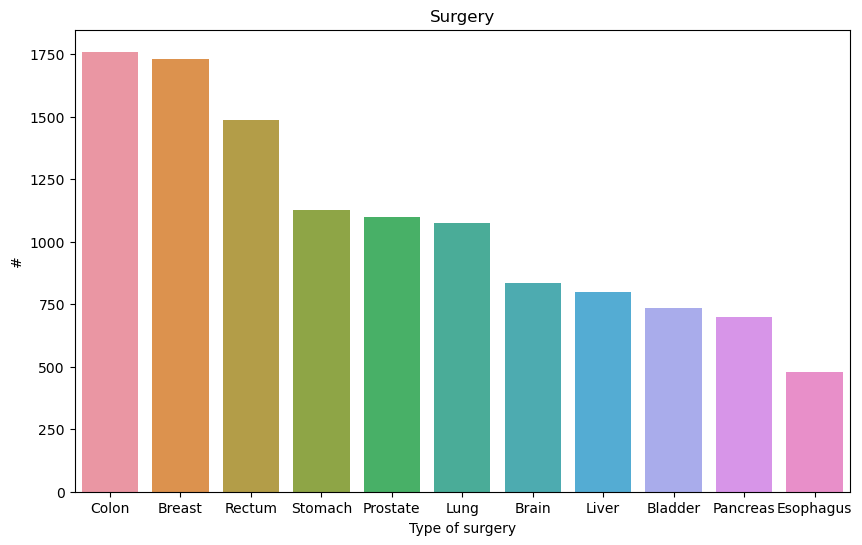

In [24]:

table = cancer['Surgery'].value_counts()
type_index = table.index
type_values = table.values

fig,ax = plt.subplots(figsize=(10,6))
sns.barplot(x =type_index  , y = type_values , ax =ax ,orient='v')
plt.title('Surgery')
plt.xlabel('Type of surgery')
plt.ylabel('#')


<AxesSubplot:xlabel='County'>

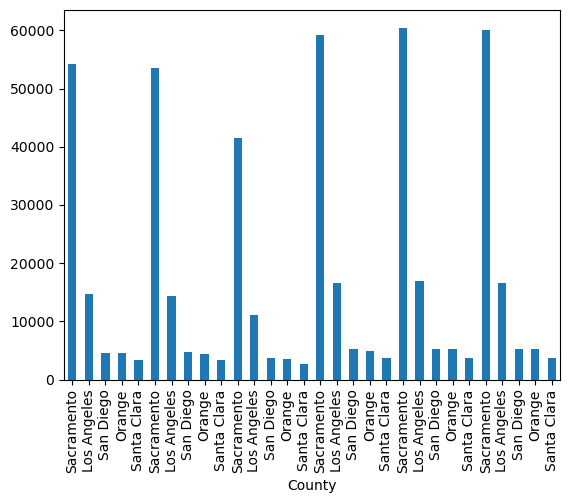

In [25]:
grouped = cancer.groupby(['Year', 'County'])['Total_cases'].sum().reset_index()
grouped = grouped.sort_values(['Year', 'Total_cases'], ascending=[True, False])
grouped = grouped.groupby('Year').head(5)
grouped.plot(x='County', y='Total_cases', kind='bar', xlim=(0,5), legend=False)


In [47]:
import folium
from folium import plugins
from folium.plugins import HeatMap

map_ = folium.Map(location=[cancer['Latitude'].mean(), cancer['Longitude'].mean()], zoom_start=6)
HeatMap(
    data=cancer[['Latitude', 'Longitude', 'Total_cases']].values,
    columns=['Latitude', 'Longitude', 'Total_cases'],
    radius=15,
).add_to(map_)

map_

In [48]:

import folium
from folium import plugins
from folium.plugins import HeatMap

def create_heatmap(surgery_type):
    surgery_data = cancer[cancer['Surgery'] == surgery_type]
    map_ = folium.Map(location=[surgery_data['Latitude'].mean(), surgery_data['Longitude'].mean()], zoom_start=6)
    HeatMap(
        data=surgery_data[['Latitude', 'Longitude', 'Total_cases']].values,
        columns=['Latitude', 'Longitude', 'Total_cases'],
        radius=15,
    ).add_to(map_)
    return map_


create_heatmap('Pancreas')


In [43]:
def create_heatmap(data, surgery_type=None, year=None):
    map_ = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()], zoom_start=6)
    if surgery_type:
        data = data[data['Surgery'] == surgery_type]
    if year:
        data = data[data['Year'] == year]
    HeatMap(
        data=data[['Latitude', 'Longitude', 'Total_cases']].values,
        columns=['Latitude', 'Longitude', 'Total_cases'],
        radius=15,
    ).add_to(map_)
    for lat, lng, hospital in zip(data['Latitude'], data['Longitude'], data['Hospital']):
        folium.Marker(
            location=[lat, lng],
            popup=f'{hospital}: {data[data["Hospital"] == hospital]["Total_cases"].sum()}',
        ).add_to(map_)
    map_.save("heatmap.html")
    return map_

create_heatmap(cancer)